--- Iniciando Proceso de Etiquetado Semi-Automático de Mantecadas (v2 - Prompt con BBox de Máscara Automática) ---
Usando dispositivo: cpu
Directorio de imágenes limpias: output_image_analysis_bimbo/potentially_good_images
Directorio de salida para máscaras: mantecadas_dataset_labels\masks
Checkpoint SAM encontrado en: 'sam_models\sam_vit_h.pth'
Cargando modelo SAM 'vit_h' al dispositivo 'cpu'...


Using CPU. Note: This module is much faster with a GPU.


Modelo SAM cargado correctamente.
SamAutomaticMaskGenerator y SamPredictor inicializados.
Inicializando EasyOCR Reader...
EasyOCR Reader inicializado.
Se encontraron 1935 imágenes para procesar.

--- Procesando imagen (1/1935): 1713824674138_1713824673902-1474.jpg ---
Generando máscaras automáticas...
Se generaron 91 máscaras automáticas.
Realizando OCR en máscaras automáticas (filtradas por área)...


C:\Users\bo244\anaconda3\envs\BimBonet\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


  ¡Match! Texto: 'Ma', Keyword: 'mantecadas', Score: 90.00 (encontrado dentro de máscara automática con área 1656)
Se encontraron 1 candidatos de 'mantecadas' por OCR. Procediendo a segmentación con prompt...
  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824674138_1713824673902-1474_mantecada_0.png


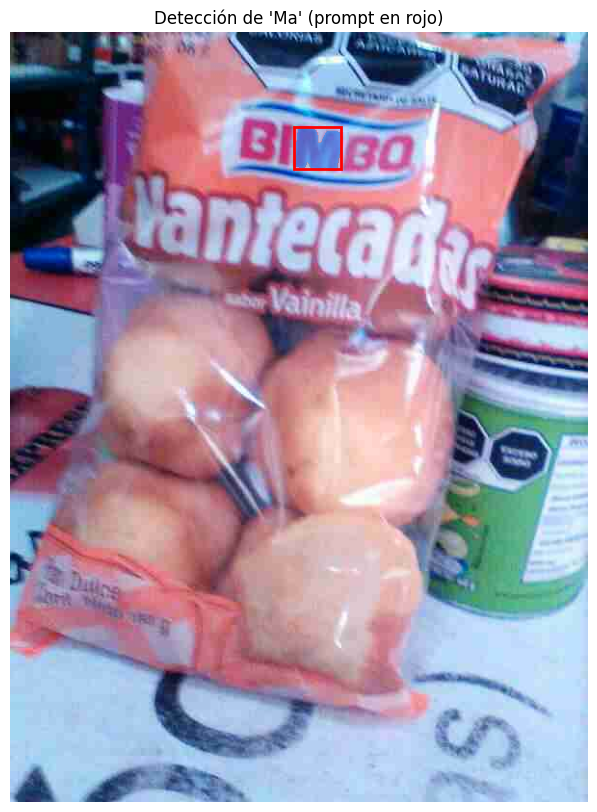


--- Procesando imagen (2/1935): 1713824687297_1713824685706-1474.jpg ---
Generando máscaras automáticas...
Se generaron 203 máscaras automáticas.
Realizando OCR en máscaras automáticas (filtradas por área)...
  ¡Match! Texto: 'Mantecadàs ,', Keyword: 'mantecadas', Score: 95.00 (encontrado dentro de máscara automática con área 36353)
  ¡Match! Texto: 'Mantecadi', Keyword: 'mantecadas', Score: 89.00 (encontrado dentro de máscara automática con área 4282)
  ¡Match! Texto: 'Manlecad', Keyword: 'mantecadas', Score: 82.00 (encontrado dentro de máscara automática con área 4091)
  ¡Match! Texto: 'Mantecadas', Keyword: 'mantecadas', Score: 100.00 (encontrado dentro de máscara automática con área 2736)
  ¡Match! Texto: 'Entecadal', Keyword: 'mantecadas', Score: 78.00 (encontrado dentro de máscara automática con área 3334)
  ¡Match! Texto: 'antecadai', Keyword: 'mantecadas', Score: 89.00 (encontrado dentro de máscara automática con área 29922)
  ¡Match! Texto: 'Mantecad;', Keyword: 'mantecadas',

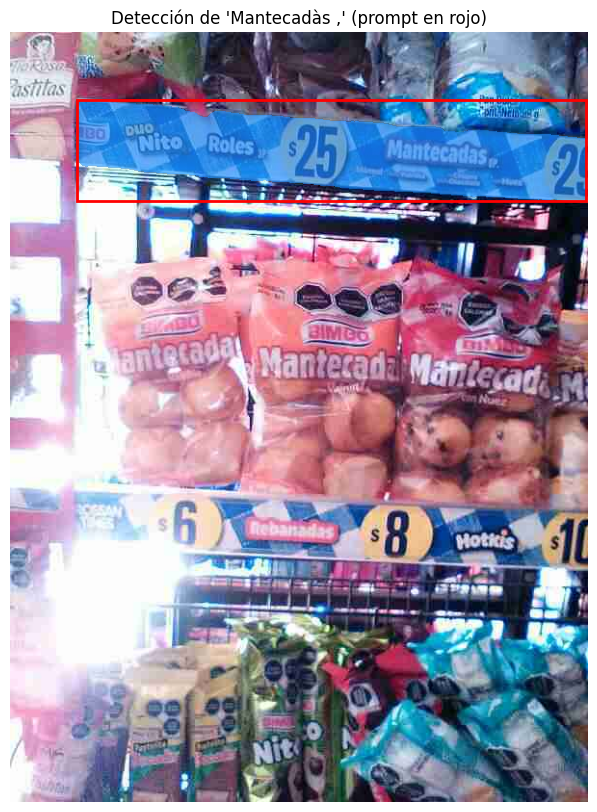

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_1.png


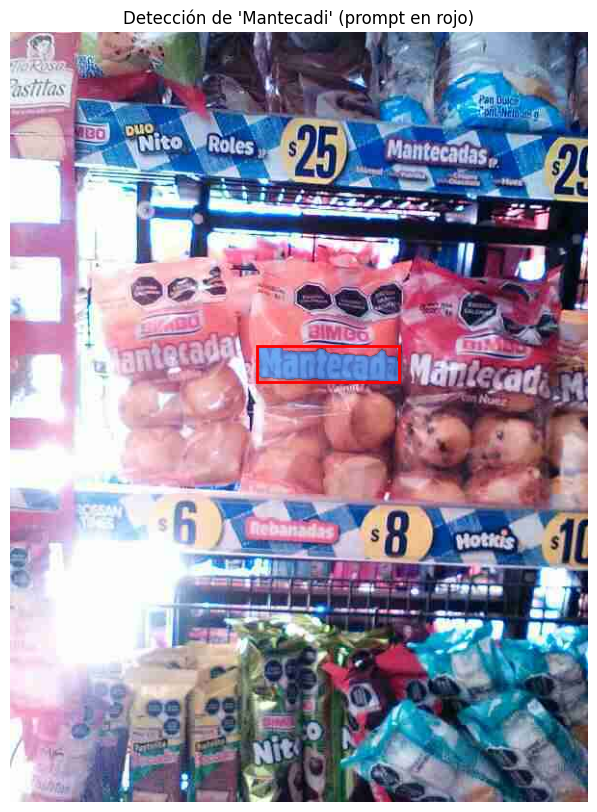

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_2.png


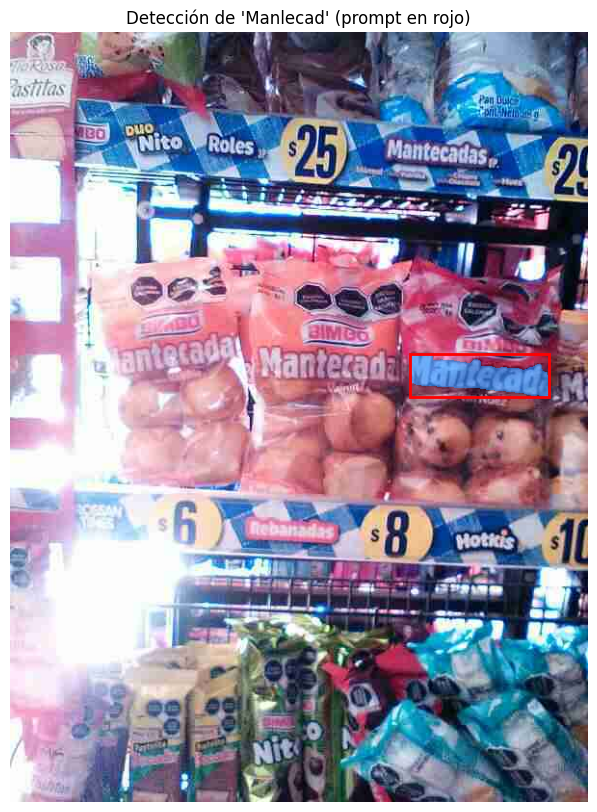

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_3.png


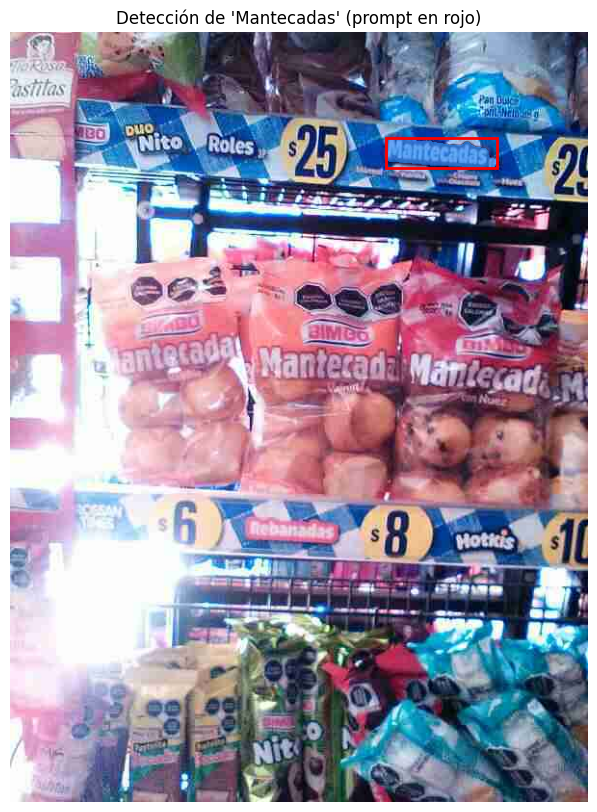

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_4.png


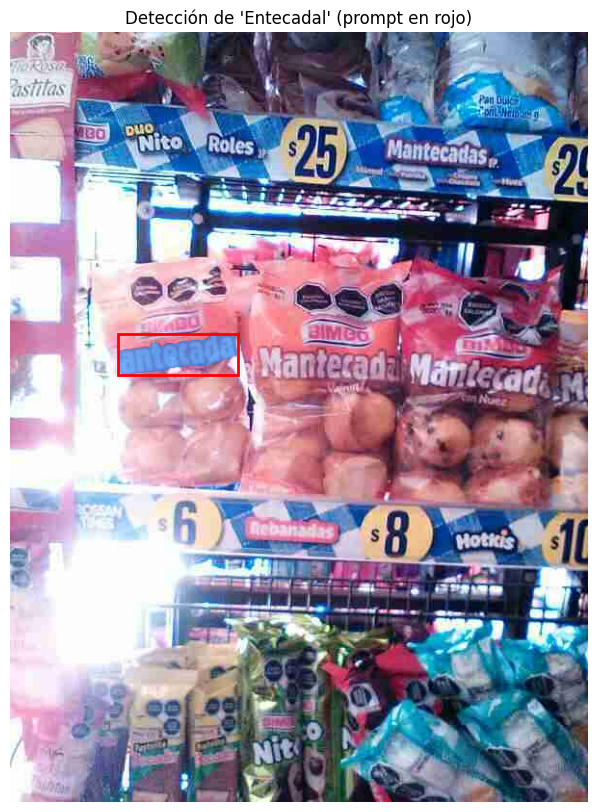

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_5.png


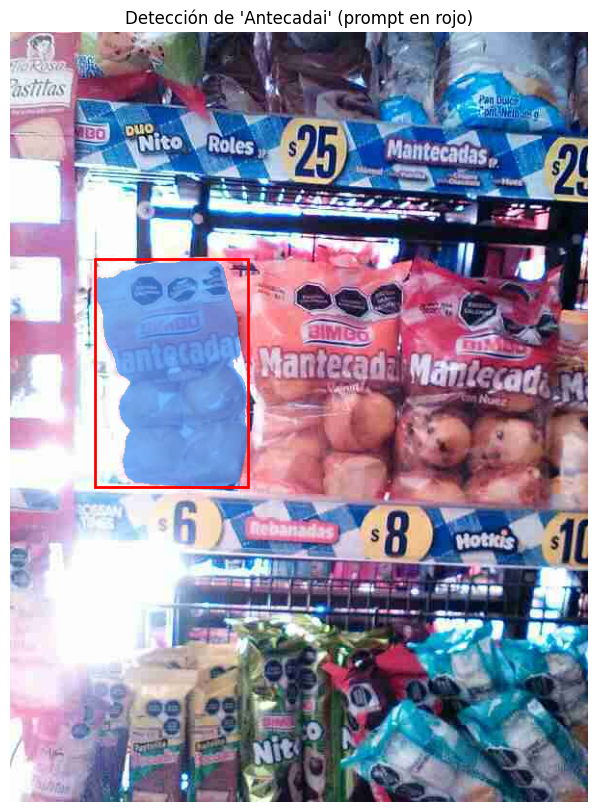

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_6.png


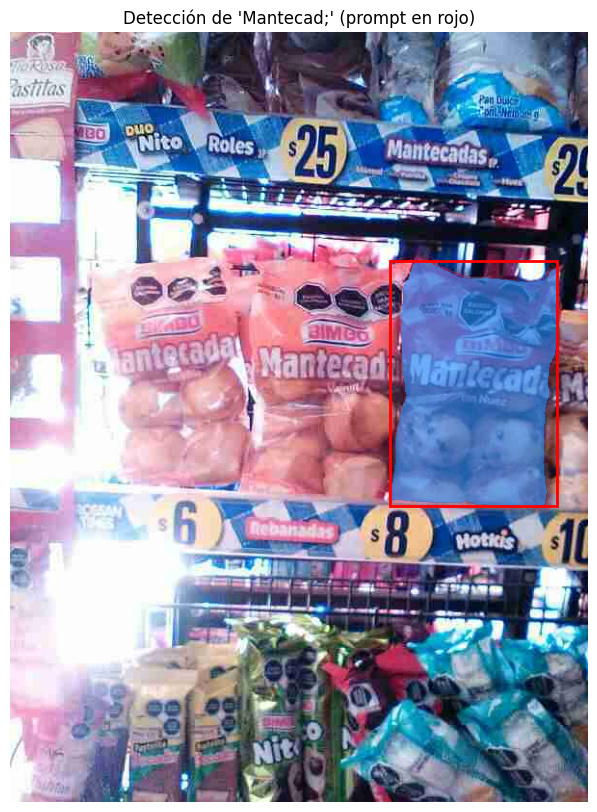

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_7.png


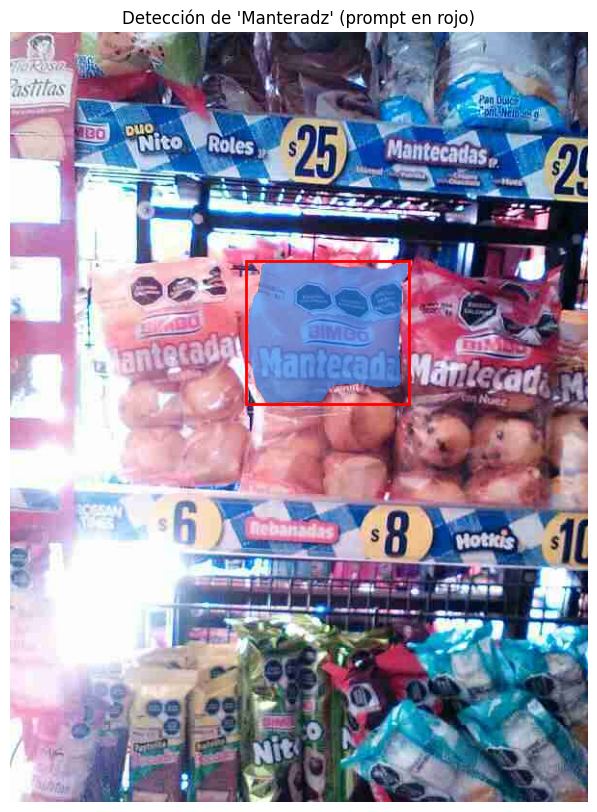

  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824687297_1713824685706-1474_mantecada_8.png


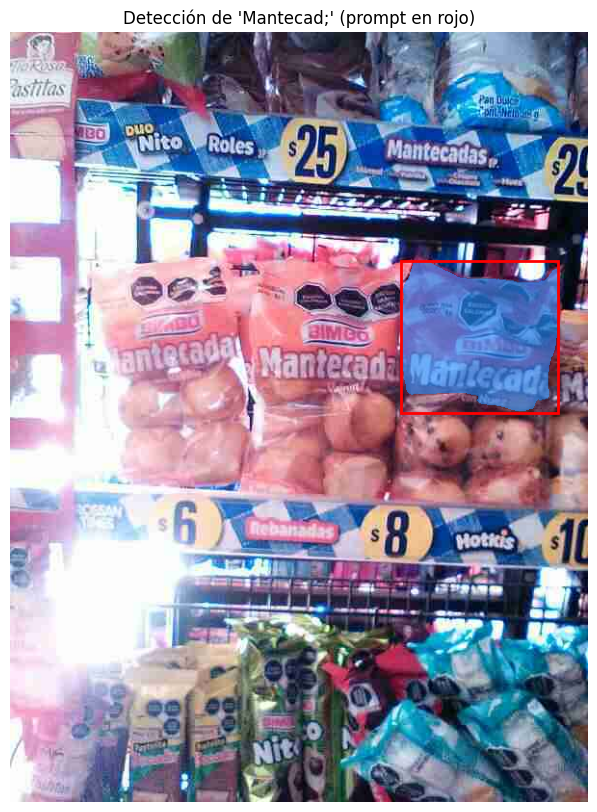


--- Procesando imagen (3/1935): 1713824850983_1713824850365-1474.jpg ---
Generando máscaras automáticas...
Se generaron 278 máscaras automáticas.
Realizando OCR en máscaras automáticas (filtradas por área)...
No se encontró texto 'mantecadas' por OCR en 1713824850983_1713824850365-1474.jpg.

--- Procesando imagen (4/1935): 1713824877501_1713821258005-1474.jpg ---
Generando máscaras automáticas...
Se generaron 172 máscaras automáticas.
Realizando OCR en máscaras automáticas (filtradas por área)...
  ¡Match! Texto: 'antecar', Keyword: 'mantecadas', Score: 75.00 (encontrado dentro de máscara automática con área 3585)
Se encontraron 1 candidatos de 'mantecadas' por OCR. Procediendo a segmentación con prompt...
  Máscara de mantecada guardada en: mantecadas_dataset_labels\masks\1713824877501_1713821258005-1474_mantecada_0.png


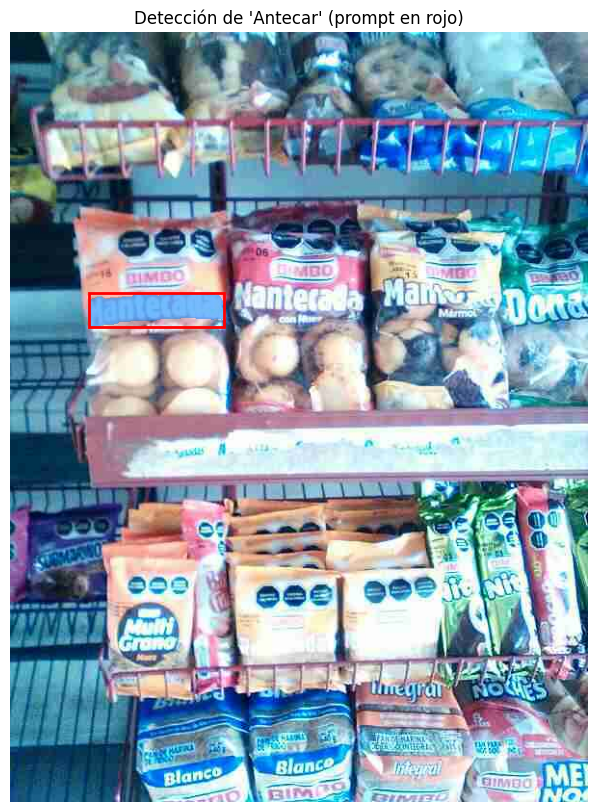


--- Procesando imagen (5/1935): 1713824916914_1713824916151-1474.jpg ---
Generando máscaras automáticas...
Se generaron 71 máscaras automáticas.
Realizando OCR en máscaras automáticas (filtradas por área)...
  ¡Match! Texto: 'antecadi', Keyword: 'mantecadas', Score: 82.00 (encontrado dentro de máscara automática con área 5063)
  ¡Match! Texto: 'nanlecada', Keyword: 'mantecadas', Score: 78.00 (encontrado dentro de máscara automática con área 94159)
  ¡Match! Texto: 'anfecad;', Keyword: 'mantecadas', Score: 75.00 (encontrado dentro de máscara automática con área 23195)
Se encontraron 3 candidatos de 'mantecadas' por OCR. Procediendo a segmentación con prompt...


In [ ]:
# -*- coding: utf-8 -*-
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import os
import urllib.request
import urllib.error
import easyocr
from thefuzz import process, fuzz
import re
import traceback
from glob import glob # Para listar archivos de imagen
import shutil 

# --- URLs de descarga SAM ---
CHECKPOINT_URLS = {
    "vit_h": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth",
    "vit_l": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
    "vit_b": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth",
}

# --- Palabras Clave para "Mantecadas" ---
TARGET_KEYWORDS = ["mantecadas", "mantecada"]
TARGET_KEYWORDS_LOWER = [kw.lower() for kw in TARGET_KEYWORDS]

# --- Configuración General ---
CHECKPOINT_DIR = "sam_models"
MODEL_TYPE = "vit_h" 
SAM_CHECKPOINT_PATH = os.path.join(CHECKPOINT_DIR, f"sam_{MODEL_TYPE}.pth")

# !!! IMPORTANTE: Define la ruta a tu carpeta de imágenes limpias !!!
# Esta es la carpeta que contiene las imágenes que quieres procesar para etiquetar "mantecadas".
# Ejemplo: 'processed_images_bimbo/good_images/potentially_good_images/'
# O 'processed_images_bimbo/equalize_contrast/potentially_good_images/'
CLEAN_IMAGES_INPUT_DIR = 'output_image_analysis_bimbo/potentially_good_images' # MODIFICAR SEGÚN SEA NECESARIO

LABEL_OUTPUT_DIR = 'mantecadas_dataset_labels'
MASKS_OUTPUT_SUBDIR = os.path.join(LABEL_OUTPUT_DIR, 'masks')

use_gpu = torch.cuda.is_available()
DEVICE = "cuda" if use_gpu else "cpu"

# Parámetros
MIN_MASK_AREA_OCR_INITIAL = 500 
OCR_FUZZY_SCORE_CUTOFF_MANTECADA = 75 
# TEXT_BBOX_PADDING ya no es tan relevante si usamos el bbox de la máscara contenedora.
# Podríamos añadir un padding opcional al bbox de la máscara si fuera necesario más adelante.

# --- Funciones Auxiliares (Reutilizadas y Adaptadas) ---
def load_image(image_path):
    if not os.path.exists(image_path):
        print(f"Error: Imagen no existe en '{image_path}'")
        return None
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Error: No se pudo cargar la imagen '{image_path}'.")
        return None
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    return image_rgb

def load_sam_model(checkpoint_path, model_type, device):
    if not os.path.exists(checkpoint_path):
        print(f"Checkpoint SAM no encontrado en: '{checkpoint_path}'")
        if model_type not in CHECKPOINT_URLS:
            print(f"Error: No URL de descarga para '{model_type}'."); return None
        download_url = CHECKPOINT_URLS[model_type]
        print(f"Intentando descargar '{model_type}' desde: {download_url}")
        try:
            os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)
            with urllib.request.urlopen(download_url) as response, open(checkpoint_path, 'wb') as out_file:
                block_size = 8192
                while True:
                    chunk = response.read(block_size)
                    if not chunk: break
                    out_file.write(chunk)
            print("Descarga completada.")
        except Exception as e:
            print(f"\nError durante la descarga: {e}")
            if os.path.exists(checkpoint_path): os.remove(checkpoint_path)
            return None
    else:
        print(f"Checkpoint SAM encontrado en: '{checkpoint_path}'")
    print(f"Cargando modelo SAM '{model_type}' al dispositivo '{device}'...")
    try:
        sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
        sam.to(device=device)
        print("Modelo SAM cargado correctamente.")
        return sam
    except Exception as e:
        print(f"Error inesperado al cargar el modelo SAM: {e}"); return None

def find_target_keyword_match(text, target_keywords_lower, score_cutoff=75):
    if not text or not target_keywords_lower:
        return None, None
    text_lower = text.lower()
    best_overall_match_word = None
    best_overall_score = 0
    for keyword in target_keywords_lower:
        score = fuzz.WRatio(text_lower, keyword)
        if score > best_overall_score:
            best_overall_score = score
            best_overall_match_word = keyword 
    if best_overall_score >= score_cutoff:
        return "mantecadas", best_overall_score # Devolver "mantecadas" canónico
    return None, None

def create_binary_mask_image(mask_bool, shape_hw):
    binary_mask = np.zeros(shape_hw, dtype=np.uint8)
    binary_mask[mask_bool] = 255
    return binary_mask

def visualize_final_segmentation(image_rgb, final_mask_bool, bbox_prompt_xywh, target_text="mantecadas"):
    """Visualiza la imagen original con la máscara final y el bbox del prompt."""
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    
    color = np.array([30/255, 144/255, 255/255, 0.6]) 
    h, w = image_rgb.shape[:2]
    mask_overlay = final_mask_bool.reshape(h, w, 1) * color.reshape(1, 1, -1)
    plt.imshow(mask_overlay)

    x, y, w_box, h_box = bbox_prompt_xywh # Este es el bbox que se usó (o representa) el prompt
    rect = plt.Rectangle((x, y), w_box, h_box, fill=False, edgecolor='red', linewidth=2)
    plt.gca().add_patch(rect)
    
    plt.title(f"Detección de '{target_text.capitalize()}' (prompt en rojo)")
    plt.axis('off')
    plt.show()

# --- Flujo Principal ---
if __name__ == "__main__":
    print("--- Iniciando Proceso de Etiquetado Semi-Automático de Mantecadas (v2 - Prompt con BBox de Máscara Automática) ---")
    print(f"Usando dispositivo: {DEVICE}")
    print(f"Directorio de imágenes limpias: {CLEAN_IMAGES_INPUT_DIR}")
    print(f"Directorio de salida para máscaras: {MASKS_OUTPUT_SUBDIR}")

    os.makedirs(MASKS_OUTPUT_SUBDIR, exist_ok=True)

    sam_model = load_sam_model(SAM_CHECKPOINT_PATH, MODEL_TYPE, DEVICE)
    if sam_model is None:
        print("Error fatal: No se pudo cargar el modelo SAM. Saliendo."); exit()

    try:
        automatic_mask_generator = SamAutomaticMaskGenerator(
            model=sam_model,
            min_mask_region_area=MIN_MASK_AREA_OCR_INITIAL
        )
        sam_predictor = SamPredictor(sam_model)
        print("SamAutomaticMaskGenerator y SamPredictor inicializados.")
    except Exception as e:
        print(f"Error inicializando generadores/predictores SAM: {e}"); exit()

    print("Inicializando EasyOCR Reader...")
    try:
        ocr_reader = easyocr.Reader(['es', 'en'], gpu=use_gpu)
        print("EasyOCR Reader inicializado.")
    except Exception as e:
        print(f"Error CRÍTICO inicializando EasyOCR: {e}"); traceback.print_exc(); exit()

    image_files = glob(os.path.join(CLEAN_IMAGES_INPUT_DIR, '*.[jJ][pP][gG]')) + \
                  glob(os.path.join(CLEAN_IMAGES_INPUT_DIR, '*.[jJ][pP][eE][gG]')) + \
                  glob(os.path.join(CLEAN_IMAGES_INPUT_DIR, '*.[pP][nN][gG]'))

    if not image_files:
        print(f"No se encontraron imágenes en {CLEAN_IMAGES_INPUT_DIR}. Verifica la ruta."); exit()
    
    print(f"Se encontraron {len(image_files)} imágenes para procesar.")

    for img_idx, image_path in enumerate(image_files):
        print(f"\n--- Procesando imagen ({img_idx+1}/{len(image_files)}): {os.path.basename(image_path)} ---")
        image_rgb = load_image(image_path)
        if image_rgb is None: continue

        print("Generando máscaras automáticas...")
        try:
            automatic_masks = automatic_mask_generator.generate(image_rgb)
        except Exception as e:
            print(f"Error generando máscaras automáticas para {os.path.basename(image_path)}: {e}"); continue
        
        print(f"Se generaron {len(automatic_masks)} máscaras automáticas.")
        
        # Lista de (bbox_de_mascara_automatica_para_prompt_xyxy, texto_ocr_original)
        potential_mantecada_prompts_data = [] 

        if not automatic_masks:
            print("No se generaron máscaras automáticas."); # continue # Ya no necesitamos el continue aquí
        else:
            print("Realizando OCR en máscaras automáticas (filtradas por área)...")
            for i, mask_info in enumerate(automatic_masks): # mask_info es un diccionario
                if mask_info.get('area', 0) < MIN_MASK_AREA_OCR_INITIAL:
                    continue 

                # BBox de la máscara automática actual ([x_min, y_min, width, height])
                auto_mask_bbox_xywh = mask_info.get('bbox') 
                if auto_mask_bbox_xywh is None: continue

                x_m, y_m, w_m, h_m = map(int, auto_mask_bbox_xywh)
                if w_m <= 0 or h_m <= 0: continue 
                
                cropped_region_for_ocr = image_rgb[y_m : y_m + h_m, x_m : x_m + w_m]
                if cropped_region_for_ocr.size == 0: continue

                try:
                    ocr_results_raw = ocr_reader.readtext(cropped_region_for_ocr, detail=1) # detail=1 para obtener bbox del texto

                    for (bbox_text_local, text, conf) in ocr_results_raw:
                        cleaned_text = re.sub(r'[^a-zA-Z0-9\s]', '', text).strip()
                        if cleaned_text:
                            matched_keyword, score = find_target_keyword_match(
                                cleaned_text,
                                TARGET_KEYWORDS_LOWER,
                                score_cutoff=OCR_FUZZY_SCORE_CUTOFF_MANTECADA
                            )
                            if matched_keyword:
                                print(f"  ¡Match! Texto: '{text}', Keyword: '{matched_keyword}', Score: {score:.2f} (encontrado dentro de máscara automática con área {mask_info.get('area',0)})")
                                
                                # Guardar el BBOX de la MÁSCARA AUTOMÁTICA que contenía este texto
                                # Convertir auto_mask_bbox_xywh a formato [x_min, y_min, x_max, y_max] para SamPredictor
                                prompt_bbox_for_predictor_xyxy = np.array([
                                    x_m, 
                                    y_m, 
                                    x_m + w_m, # x_max
                                    y_m + h_m  # y_max
                                ])
                                potential_mantecada_prompts_data.append( (prompt_bbox_for_predictor_xyxy, text, auto_mask_bbox_xywh) )
                                break # Salir del bucle de OCR para esta máscara automática si ya encontramos "mantecadas"
                except Exception as e_ocr:
                    print(f"    Error durante OCR en una máscara: {e_ocr}")
        
        # Filtrar prompts duplicados o muy solapados si es necesario (omitido por simplicidad ahora)

        if potential_mantecada_prompts_data:
            print(f"Se encontraron {len(potential_mantecada_prompts_data)} candidatos de 'mantecadas' por OCR. Procediendo a segmentación con prompt...")
            sam_predictor.set_image(image_rgb)
            
            base_filename = os.path.splitext(os.path.basename(image_path))[0]
            mantecada_instance_counter = 0

            for prompt_bbox_xyxy, ocr_text_original, auto_mask_bbox_xywh_for_viz in potential_mantecada_prompts_data:
                try:
                    masks_prompted, scores, logits = sam_predictor.predict(
                        box=prompt_bbox_xyxy, # Usamos el bbox de la máscara automática
                        multimask_output=True 
                    )
                    
                    best_mask_idx = np.argmax(scores)
                    final_mantecada_mask_bool = masks_prompted[best_mask_idx]

                    mask_filename = f"{base_filename}_mantecada_{mantecada_instance_counter}.png"
                    mask_filepath = os.path.join(MASKS_OUTPUT_SUBDIR, mask_filename)
                    
                    binary_image_to_save = create_binary_mask_image(final_mantecada_mask_bool, image_rgb.shape[:2])
                    cv2.imwrite(mask_filepath, binary_image_to_save)
                    print(f"  Máscara de mantecada guardada en: {mask_filepath}")
                    
                    # Para visualización, usamos el auto_mask_bbox_xywh_for_viz que es el que se usó para generar el prompt
                    visualize_final_segmentation(image_rgb, final_mantecada_mask_bool, auto_mask_bbox_xywh_for_viz, ocr_text_original)

                    mantecada_instance_counter += 1
                except Exception as e_pred:
                    print(f"    Error durante predicción con prompt para bbox {prompt_bbox_xyxy}: {e_pred}")
                    traceback.print_exc()
        else:
            print(f"No se encontró texto 'mantecadas' por OCR en {os.path.basename(image_path)}.")
            
    print("\n--- Proceso de etiquetado semi-automático de mantecadas finalizado. ---")